# TLT SSD example usecase



0. [设置环境变量](#head-0)
1. [准备数据集和预训练模型](#head-1) <br>
    1.1 [将数据集从kitti格式转换成tfrecords的格式](#head-1-1) <br>
    1.2 [下载预训练模型](#head-1-2) <br>
2. [定义训练设置](#head-2)
3. [开始TLT训练](#head-3)
4. [评估训练结果](#head-4)
5. [模型剪枝](#head-5)
6. [训练剪枝模型](#head-6)
7. [评估训练好的模型](#head-7)
8. [可视化推理结果](#head-8)
9. [模型部署](#head-9)

## 0. 设置环境变量 <a class="anchor" id="head-0"></a> Setting up environment variables <a class="anchor" id="head-0"></a>

In [118]:
# 设置环境变量.
print("Please replace the variable with your key.")
# 请从NGC官网生成API_KEY

# API_KEY updated (This key should be unique and replace this with yours)
%set_env KEY=NmhuanZkZmVvZ28yY3ZianBlZWJyMzdhcWQ6ZWRjMmIzYmUtMDdkOS00ODZjLTgyOGUtMmRjZDNlOGExOTU1


%set_env USER_EXPERIMENT_DIR=/workspace/mydata/ssd
# %set_env DATA_DOWNLOAD_DIR=/workspace/mydata/ssd/data
%set_env SPECS_DIR=/workspace/mydata/ssd/specs
!mkdir -p $DATA_DOWNLOAD_DIR

Please replace the variable with your key.
env: KEY=NmhuanZkZmVvZ28yY3ZianBlZWJyMzdhcWQ6ZWRjMmIzYmUtMDdkOS00ODZjLTgyOGUtMmRjZDNlOGExOTU1
env: USER_EXPERIMENT_DIR=/workspace/mydata/ssd
env: SPECS_DIR=/workspace/mydata/ssd/specs
mkdir: missing operand
Try 'mkdir --help' for more information.


## 1. 准备数据集和预训练模型 <a class="anchor" id="head-1"></a> Prepare dataset and pretrained model <a class="anchor" id="head-1"></a>

 这里将使用kitti数据集。 可以访问下面链接查看详情：
 http://www.cvlibs.net/datasets/kitti/eval_object.php?obj_benchmark=2d. 
 
 We will use kitti dataset. Please find more details on the following link.  http://www.cvlibs.net/datasets/kitti/eval_object.php?obj_benchmark=2d. 
 
 从这里下载图片数据集 (http://www.cvlibs.net/download.php?file=data_object_image_2.zip)
 
 Download image dataset here (http://www.cvlibs.net/download.php?file=data_object_image_2.zip)
 
 从这里下载标签(http://www.cvlibs.net/download.php?file=data_object_label_2.zip) 
 
 Download groundtruth here(http://www.cvlibs.net/download.php?file=data_object_label_2.zip) 
 
 并把他们保存在 $DATA_DOWNLOAD_DIR.
 
 Save them under $DATA_DOWNLOAD_DIR.

Additionally, if you have your own dataset already in a volume (or folder), you can mount the volume on `DATA_DOWNLOAD_DIR` (or create a soft link). Below shows an example:
```bash
# if your dataset is in /dev/sdc1
mount /dev/sdc1 $DATA_DOWNLOAD_DIR

# if your dataset is in folder /var/dataset
ln -sf /var/dataset $DATA_DOWNLOAD_DIR
```

In [119]:
# !ln -sf /home/jiahui/codes/image_ready $DATA_DOWNLOAD_DIR
# 
!ln -sf  $DATA_DOWNLOAD_DIR 

ln: missing file operand
Try 'ln --help' for more information.


### 1.1 将数据集从KITTI格式转换成TFrecords <a class="anchor" id="head-1-1"></a>Transfer dataset from KITTI into TFrecords

* 更新tfrecords定义文件 

  Updating tfrecords config file

* 使用tlt-dataset-convert 创建tfrecords

  Create tfrecords using tlt-dataset-convert

* TFRecords 只需要被创建一次

  TFRecords need to be created only ONCE

In [120]:
print("TFrecords conversion spec file for training")
!cat $SPECS_DIR/ssd_tfrecords_kitti_trainval.txt

TFrecords conversion spec file for training
kitti_config {
  root_directory_path: "/workspace/tlt-experiments/data/training/"
  image_dir_name: "image_2"
  label_dir_name: "label_2"
  image_extension: ".png"
  partition_mode: "random"
  num_partitions: 2
  val_split: 14
  num_shards: 10
}
image_directory_path: "/workspace/tlt-experiments/data/training/"


In [121]:
# Creating a new directory for the output tfrecords dump.
!mkdir -p $USER_EXPERIMENT_DIR/tfrecords
#KITTI trainval
!tlt-dataset-convert -d $SPECS_DIR/ssd_tfrecords_kitti_trainval.txt \
                     -o $USER_EXPERIMENT_DIR/tfrecords/kitti_trainval/kitti_trainval

2020-10-17 12:22:14.392092: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
Using TensorFlow backend.
2020-10-17 12:22:17,504 - iva.detectnet_v2.dataio.build_converter - INFO - Instantiating a kitti converter
2020-10-17 12:22:17,541 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Num images in
Train: 7883	Val: 1283
2020-10-17 12:22:17,541 - iva.detectnet_v2.dataio.kitti_converter_lib - INFO - Validation data in partition 0. Hence, while choosing the validationset during training choose validation_fold 0.
2020-10-17 12:22:17,551 - iva.detectnet_v2.dataio.dataset_converter_lib - INFO - Writing partition 0, shard 0

2020-10-17 12:22:17,551 - tensorflow - WARNING - From /home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/detectnet_v2/dataio/dataset_converter_lib.py:142: The name tf.python

In [122]:
!ls -rlt $USER_EXPERIMENT_DIR/tfrecords/kitti_trainval

total 5996
-rw-r--r-- 1 root root  85220 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00000-of-00010
-rw-r--r-- 1 root root  86181 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00001-of-00010
-rw-r--r-- 1 root root  85193 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00002-of-00010
-rw-r--r-- 1 root root  85687 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00003-of-00010
-rw-r--r-- 1 root root  86518 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00004-of-00010
-rw-r--r-- 1 root root  85728 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00005-of-00010
-rw-r--r-- 1 root root  86614 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00006-of-00010
-rw-r--r-- 1 root root  85984 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00007-of-00010
-rw-r--r-- 1 root root  85158 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00008-of-00010
-rw-r--r-- 1 root root  87097 Oct 17 12:22 kitti_trainval-fold-000-of-002-shard-00009-of-00010
-rw-r--r-- 1 root root 523054 Oct 17 12

### 1.2 下载模型 <a class="anchor" id="head-1-2"></a>Download pretrained model <a class="anchor" id="head-1-2"></a>

我们这里将使用NGC CLI来下载预训练模型. 访问 [ngc.nvidia.com](ngc.nvidia.com) 查看详情.

We will use NGC CLI to download pretrained model. Please viste [ngc.nvidia.com](ngc.nvidia.com) for more.

In [6]:
!ngc registry model list nvidia/tlt_pretrained_object_detection:*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| resne | 74.38 | 80    | 1     | V100  | 38.3  | 38.31 | UPLOA | Apr   |
| t10   |       |       |       |       |       | MB    | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| resne | 76.74 | 80    | 1     | V100  | 89.0  | 88.96 | UPLOA | Apr   |
| t18   |       |       |       |       |       | MB    | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| resne | 77.04 | 80    | 1     | V100  | 170.7 | 170.6 | UPLOA | Apr   |
| t34   |       |       |       |     

In [75]:
!mkdir -p $USER_EXPERIMENT_DIR/pretrained_resnet18/

In [76]:
# !mkdir -p $USER_EXPERIMENT_DIR/pretrained_mobilenet_v1/

In [104]:
# Pull pretrained model from NGC
# !ngc registry model download-version nvidia/tlt_pretrained_object_detection:resnet18 --dest $USER_EXPERIMENT_DIR/pretrained_resnet18

Downloaded 232 KB in 23s, Download speed: 10.07 KB/s               ^C

Terminating, please wait...


In [66]:
# !ngc registry model download-version nvidia/tlt_pretrained_object_detection:mobilenet_v1 --dest $USER_EXPERIMENT_DIR/pretrained_mobilenet_v1

Downloaded 32 KB in 1m 11s, Download speed: 460.87 B/s               
HTTPSConnectionPool(host='s3.us-west-2.amazonaws.com', port=443): Read timed out.
Downloaded 32 KB in 1m 12s, Download speed: 454.48 B/s               
----------------------------------------------------
Transfer id: tlt_pretrained_object_detection_vmobilenet_v1 Download status: Failed.
Downloaded local path: /workspace/mydata/ssd/pretrained_mobilenet_v1/tlt_pretrained_object_detection_vmobilenet_v1
Total files downloaded: 0 
Total downloaded size: 32 KB
Started at: 2020-10-14 14:23:14.493449
Completed at: 2020-10-14 14:24:26.597490
Duration taken: 1m 12s
----------------------------------------------------


In [123]:
print("Check that model is downloaded into dir.")
!ls -l $USER_EXPERIMENT_DIR/pretrained_resnet18/tlt_pretrained_object_detection_vresnet18

Check that model is downloaded into dir.
total 91096
-rw------- 1 root root 93278448 Oct 14 01:26 resnet_18.hdf5


In [8]:
# print("Check that model is downloaded into dir.")
# !ls -l $USER_EXPERIMENT_DIR/pretrained_mobilenet_v1/tlt_pretrained_object_detection_mobilenet_v1

## 2. 提供训练设置定义 <a class="anchor" id="head-2"></a>Config training specifications <a class="anchor" id="head-2"></a>

* Tfrecords for the train datasets
    * 为了使用新生成的tfrecords，请将spec文件中的dataset_config参数更新为' $SPECS_DIR/ssd_train_mobilenet_v2_kitti .txt '
    
      In order to use newly generated tfrecords, please update dataset_config into '$SPECS_DIR/ssd_train_mobilenet_v2_kitti .txt' in file spec
    
* 预训练模型
  
  Pretrained models

* 为动态数据增加参数
  
  Adding parameter for dynamic data

* 设置一些训练的超参数.
  
  Hyperparameter configuration such as bath size, number of epochs, learning rate etc.

In [9]:
# To enable QAT training on sample spec file, uncomment following lines
# !sed -i "s/enable_qat: false/enable_qat: true/g" $SPECS_DIR/ssd_train_resnet18_kitti.txt
# !sed -i "s/enable_qat: false/enable_qat: true/g" $SPECS_DIR/ssd_retrain_resnet18_kitti.txt

In [10]:
# By default, the sample spec file disables QAT training. You can force non-QAT training by running lines below
# !sed -i "s/enable_qat: true/enable_qat: false/g" $SPECS_DIR/ssd_train_resnet18_kitti.txt
# !sed -i "s/enable_qat: true/enable_qat: false/g" $SPECS_DIR/ssd_retrain_resnet18_kitti.txt

In [143]:
!cat $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt

random_seed: 42
ssd_config {
  aspect_ratios_global: "[1.0, 2.0, 0.5, 3.0, 1.0/3.0]"
  scales: "[0.05, 0.1, 0.25, 0.4, 0.55, 0.7, 0.85]"
  two_boxes_for_ar1: true
  clip_boxes: false
  loss_loc_weight: 0.8
  focal_loss_alpha: 0.25
  focal_loss_gamma: 2.0
  variances: "[0.1, 0.1, 0.2, 0.2]"
  arch: "mobilenet_v1"
  freeze_bn: false
}
training_config {
  batch_size_per_gpu: 4
  num_epochs: 150
  learning_rate {
  soft_start_annealing_schedule {
    min_learning_rate: 5e-8
    max_learning_rate: 5e-4
    soft_start: 0.1
    annealing: 0.3
    }
  }
  regularizer {
    type: L2
    weight: 0.00004
  }
}
eval_config {
  validation_period_during_training: 5
  average_precision_mode: SAMPLE
  batch_size: 2
  matching_iou_threshold: 0.2
}
nms_config {
  confidence_threshold: 0.05
  clustering_iou_threshold: 0.6
  top_k: 200
}
augmentation_config {
  preprocessing {
    output_image_width: 300
    output_image_height: 300
    output_image_channel: 3
    crop_right: 300
    crop_bottom: 300
    

## 3. 开始TLT训练 <a class="anchor" id="head-3"></a>TLT Training


In [12]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_unpruned

In [144]:
print("To run with multigpu, please change --gpus based on the number of available GPUs in your machine.")
!tlt-train ssd -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
               -k $KEY \
               --gpus 1 \
               --initial_epoch 2
# -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_011.tlt \


To run with multigpu, please change --gpus based on the number of available GPUs in your machine.
Using TensorFlow backend.
2020-10-17 15:09:54.047222: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 15:09:59.753826: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-17 15:09:59.804834: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: TITAN RTX major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:81:00.0
2020-10-17 15:09:59.804895: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 15:09:59.840242: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-10-17 15:09:59.856510: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Suc

In [22]:
print("To resume from checkpoint, please uncomment and run this instead. Change last two arguments accordingly.")
# !tlt-train ssd -e $SPECS_DIR/ssd_train_resnet18_kitti.txt \
#                -r $USER_EXPERIMENT_DIR/experiment_dir_unpruned \
#                -k $KEY \
#                -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_001.tlt \
#                --gpus 1 \
#                --initial_epoch 2 

To resume from checkpoint, please uncomment and run this instead. Change last two arguments accordingly.


In [34]:
print('Model for each epoch:')
print('---------------------')
!ls -ltrh $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights

Model for each epoch:
---------------------
total 772M
-rw-r--r-- 1 root root 5.2M Oct 16 07:00 ssd_mobilenet_v2_epoch_002.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:04 ssd_mobilenet_v2_epoch_003.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:09 ssd_mobilenet_v2_epoch_004.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:14 ssd_mobilenet_v2_epoch_005.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:19 ssd_mobilenet_v2_epoch_006.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:24 ssd_mobilenet_v2_epoch_007.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:28 ssd_mobilenet_v2_epoch_008.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:33 ssd_mobilenet_v2_epoch_009.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:38 ssd_mobilenet_v2_epoch_010.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:43 ssd_mobilenet_v2_epoch_011.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:48 ssd_mobilenet_v2_epoch_012.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:52 ssd_mobilenet_v2_epoch_013.tlt
-rw-r--r-- 1 root root 5.2M Oct 16 07:57 ssd_mobilenet_v2_epoch_014.tlt
-rw-r--r-

In [38]:
# Now check the evaluation stats in the csv file and pick the model with highest eval accuracy.
# !cat $USER_EXPERIMENT_DIR/experiment_dir_unpruned/ssd_training_log_resnet18.csv
!cat $USER_EXPERIMENT_DIR/experiment_dir_unpruned/ssd_training_log_mobilenet_v2.csv
%set_env EPOCH=090

epoch,AP_mandatory,AP_prohibitory,AP_warning,loss,mAP
2,nan,nan,nan,0.9353677650078978,nan
3,nan,nan,nan,0.9488368127477627,nan
4,nan,nan,nan,0.9303256592898864,nan
5,0.3446434195069534,0.3152173340187726,0.10954023350201694,0.9234270753845977,0.2564669956759143
6,nan,nan,nan,0.9457992911060019,nan
7,nan,nan,nan,0.8713417228997813,nan
8,nan,nan,nan,0.9096438096325681,nan
9,nan,nan,nan,0.8809145101606567,nan
10,0.367752494786772,0.35540126326160404,0.10803403350272217,0.8997571985503019,0.27706259718369936
11,nan,nan,nan,0.8609618199161551,nan
12,nan,nan,nan,0.8391287264225079,nan
13,nan,nan,nan,0.9094914557138707,nan
14,nan,nan,nan,0.8158901602698889,nan
15,0.18803855398885053,0.35004874829107474,0.15152722940160968,0.8667404483812117,0.22987151056051167
16,nan,nan,nan,0.8768637867538142,nan
17,nan,nan,nan,0.8804567173694873,nan
18,nan,nan,nan,0.9433755311344805,nan
19,nan,nan,nan,0.9423745517088388,nan
20,0.24874664744566385,0.2883526304058134,0.22035112447262722,0.8429743259225191,0.

## 4. 评估模型 <a class="anchor" id="head-4"></a>Model evaluation

In [41]:
!tlt-evaluate ssd -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_$EPOCH.tlt \
                  -k $KEY
# -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_resnet18_epoch_$EPOCH.tlt \

Using TensorFlow backend.
2020-10-17 02:44:49.067855: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 02:44:52,242 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_train_mobilenet_v2_kitti.txt
2020-10-17 02:44:55.145818: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-17 02:44:55.188254: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: TITAN RTX major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:81:00.0
2020-10-17 02:44:55.188301: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 02:44:55.193399: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020

## 5. 模型剪枝 <a class="anchor" id="head-5"></a>Pruning the Model
* 定义预训练模型
  
  Define pretrained model
  
* 定义threshold

  Define threshold
  
* 定义API_KEY
  
  Define API_KEY
  
* 定义输出模型位置

  Define model output directory.

通常，你只需要调整'-pth '(阈值)的准确性和模型大小权衡. 更高的`pth` 会获得更小的模型 (以及更快的速度) 但是比较低的精度. 阈值取决于数据集和模型 。 

You need to adjust '-pth' to balance model size and accuracy. Higher 'pth' will get a smaller model(and faster speed) but reduce accuracy. 'pth' value depends on the dataset and model you choosen.

In [42]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_pruned

In [44]:
!tlt-prune -m $USER_EXPERIMENT_DIR/experiment_dir_unpruned/weights/ssd_mobilenet_v2_epoch_$EPOCH.tlt \
           -o $USER_EXPERIMENT_DIR/experiment_dir_pruned/ssd_mobilenet_v2_pruned.tlt \
           -eq intersection \
           -pth 0.1 \
           -k $KEY

2020-10-17 02:50:13.340677: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
Using TensorFlow backend.
2020-10-17 02:50:19.407332: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-17 02:50:19.456049: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: TITAN RTX major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:81:00.0
2020-10-17 02:50:19.456095: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 02:50:19.457888: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-10-17 02:50:19.459322: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2020-10-17 02:50:19.459715: I tensorflow/stream_

In [45]:
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_pruned/

total 5300
-rw-r--r-- 1 root root 5425320 Oct 17 02:51 ssd_mobilenet_v2_pruned.tlt


## 6. 重新训练剪枝后的模型 <a class="anchor" id="head-6"></a> Pruned model retraining

* 修剪后的模型需要重新训练以恢复精度

  Retrain the pruned model to recover accuracy.

* WARNING: 训练会花费比较长的时间，您可以减少epochs来少训练几圈

  WARNING: Training may be time consuming, you can reduce time consumption by reducing epochs.

In [56]:
# Printing the retrain spec file. 
# Here we have updated the spec file to include the newly pruned model as a pretrained weights.
!cat $SPECS_DIR/ssd_retrain_mobilenet_v2_kitti.txt

random_seed: 42
ssd_config {
  aspect_ratios_global: "[1.0, 2.0, 0.5, 3.0, 1.0/3.0]"
  scales: "[0.05, 0.1, 0.25, 0.4, 0.55, 0.7, 0.85]"
  two_boxes_for_ar1: true
  clip_boxes: false
  loss_loc_weight: 0.8
  focal_loss_alpha: 0.25
  focal_loss_gamma: 2.0
  variances: "[0.1, 0.1, 0.2, 0.2]"
  arch: "mobilenet_v2"
  freeze_bn: false
}
training_config {
  batch_size_per_gpu: 4
  num_epochs: 20
  learning_rate {
  soft_start_annealing_schedule {
    min_learning_rate: 5e-8
    max_learning_rate: 5e-4
    soft_start: 0.1
    annealing: 0.3
    }
  }
}
eval_config {
  validation_period_during_training: 5
  average_precision_mode: SAMPLE
  batch_size: 2
  matching_iou_threshold: 0.5
}
nms_config {
  confidence_threshold: 0.01
  clustering_iou_threshold: 0.6
  top_k: 200
}
augmentation_config {
  preprocessing {
    output_image_width: 300
    output_image_height: 300
    output_image_channel: 3
    crop_right: 300
    crop_bottom: 300
    min_bbox_width: 1.0
    min_bbox_height: 1.0
  }
  spa

In [46]:
!mkdir -p $USER_EXPERIMENT_DIR/experiment_dir_retrain

In [57]:
# Retraining using the pruned model as pretrained weights 
!tlt-train ssd --gpus 1 \
               -e $SPECS_DIR/ssd_retrain_mobilenet_v2_kitti.txt \
               -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
               -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_mobilenet_v2_epoch_040.tlt \
               -k $KEY
# -r $USER_EXPERIMENT_DIR/experiment_dir_retrain \
# -m $USER_EXPERIMENT_DIR/experiment_dir_pruned/ssd_mobilenet_v2_pruned.tlt \

Using TensorFlow backend.
2020-10-17 06:51:56.438447: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 06:51:59.885831: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-17 06:51:59.945308: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: TITAN RTX major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:81:00.0
2020-10-17 06:51:59.945375: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 06:51:59.948928: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-10-17 06:51:59.951089: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2020-10-17 06:51:59.952815: I tensorflow/stream_

In [58]:
# Listing the newly retrained model.
!ls -rlt $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights

total 211840
-rw-r--r-- 1 root root 5421488 Oct 17 05:12 ssd_mobilenet_v2_epoch_021.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:17 ssd_mobilenet_v2_epoch_022.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:21 ssd_mobilenet_v2_epoch_023.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:26 ssd_mobilenet_v2_epoch_024.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:31 ssd_mobilenet_v2_epoch_025.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:35 ssd_mobilenet_v2_epoch_026.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:40 ssd_mobilenet_v2_epoch_027.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:44 ssd_mobilenet_v2_epoch_028.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:49 ssd_mobilenet_v2_epoch_029.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:53 ssd_mobilenet_v2_epoch_030.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 05:58 ssd_mobilenet_v2_epoch_031.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 06:03 ssd_mobilenet_v2_epoch_032.tlt
-rw-r--r-- 1 root root 5421488 Oct 17 06:07 ssd_mobilenet_v2_epoch_033.tlt
-rw-r--r-- 1

In [60]:
# Now check the evaluation stats in the csv file and pick the model with highest eval accuracy.
!cat $USER_EXPERIMENT_DIR/experiment_dir_retrain/ssd_training_log_mobilenet_v2.csv
%set_env EPOCH=020

epoch,AP_mandatory,AP_prohibitory,AP_warning,loss,mAP
1,nan,nan,nan,0.5487938238742567,nan
2,nan,nan,nan,0.5532167471596366,nan
3,nan,nan,nan,0.6188818919803456,nan
4,nan,nan,nan,0.6202663411098812,nan
5,0.45991654619455113,0.5862383639563403,0.3180372101005041,0.5865383774871521,0.4547307067504652
6,nan,nan,nan,0.5228471415179674,nan
7,nan,nan,nan,0.5183474395160151,nan
8,nan,nan,nan,0.4817531481977653,nan
9,nan,nan,nan,0.4971711226424047,nan
10,0.6215862721556099,0.6116834508991371,0.3987684216302187,0.4669811204245699,0.5440127148949886
11,nan,nan,nan,0.44528783433630686,nan
12,nan,nan,nan,0.5037953220421084,nan
13,nan,nan,nan,0.43623448713613766,nan
14,nan,nan,nan,0.442942057663472,nan
15,0.6351763537117029,0.6103001461013632,0.4019340495458658,0.4504470243870121,0.5491368497863106
16,nan,nan,nan,0.4472517352346488,nan
17,nan,nan,nan,0.5234392320291184,nan
18,nan,nan,nan,0.5062504789362495,nan
19,nan,nan,nan,0.45780555913712695,nan
20,0.6328325480248187,0.6162831286360697,0.4015397

## 7. 评估训练好的模型 <a class="anchor" id="head-7"></a> Trained model evaluation

In [61]:
!tlt-evaluate ssd -e $SPECS_DIR/ssd_retrain_mobilenet_v2_kitti.txt \
                  -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_mobilenet_v2_epoch_$EPOCH.tlt \
                  -k $KEY

Using TensorFlow backend.
2020-10-17 08:40:49.106595: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 08:40:53,704 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_retrain_mobilenet_v2_kitti.txt
2020-10-17 08:40:56.378179: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-17 08:40:56.421072: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: TITAN RTX major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:81:00.0
2020-10-17 08:40:56.421117: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 08:40:56.422816: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
20

## 8. 可视化推理结果 <a class="anchor" id="head-8"></a> Results Visualization


In [67]:
# Copy some test images
!mkdir -p /workspace/examples/ssd/test_samples
!cp /workspace/tlt-experiments/data/training/testing/image_2/00000* /workspace/examples/ssd/test_samples/
# !cp /workspace/tlt-experiments/testing/image_2/0* /workspace/examples/ssd/test_samples/

In [66]:
# !echo $DATA_DOWNLOAD_DIR

In [108]:
# Running inference for detection on n images
!tlt-infer ssd -i /workspace/examples/ssd/test_samples \
               -o $USER_EXPERIMENT_DIR/ssd_infer_images \
               -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
               -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_mobilenet_v2_epoch_020.tlt \
               -l $USER_EXPERIMENT_DIR/ssd_infer_labels \
               -k $KEY

Using TensorFlow backend.
2020-10-17 10:54:26.772033: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 10:54:30,140 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_train_mobilenet_v2_kitti.txt
Traceback (most recent call last):
  File "/usr/local/bin/tlt-infer", line 8, in <module>
    sys.exit(main())
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/magnet_infer.py", line 45, in main
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816f3bb6f309cd506049bb/execroot/ai_infra/bazel-out/k8-py3-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/ssd/scripts/inference.py", line 133, in main
  File "/home/vpraveen/.cache/dazel/_dazel_vpraveen/715c8bafe7816

`tlt-infer` 会有两个输出。 

There will be two outputs for 'tlt-infer'

1. 图片存在`$USER_EXPERIMENT_DIR/ssd_infer_images`
   
   Image will be saved under `$USER_EXPERIMENT_DIR/ssd_infer_images`
   
2. label存在`$USER_EXPERIMENT_DIR/ssd_infer_labels`

   label will be saved under `$USER_EXPERIMENT_DIR/ssd_infer_labels`

In [75]:
# Simple grid visualizer
import matplotlib.pyplot as plt
import os
from math import ceil
valid_image_ext = ['.jpg', '.png', '.jpeg', '.ppm']

def visualize_images(image_dir, num_cols=4, num_images=10):
    output_path = os.path.join(os.environ['USER_EXPERIMENT_DIR'], image_dir)
    num_rows = int(ceil(float(num_images) / float(num_cols)))
    f, axarr = plt.subplots(num_rows, num_cols, figsize=[80,30])
    f.tight_layout()
    a = [os.path.join(output_path, image) for image in os.listdir(output_path) 
         if os.path.splitext(image)[1].lower() in valid_image_ext]
    for idx, img_path in enumerate(a[:num_images]):
        col_id = idx % num_cols
        row_id = idx // num_cols
        img = plt.imread(img_path)
        axarr[row_id, col_id].imshow(img) 

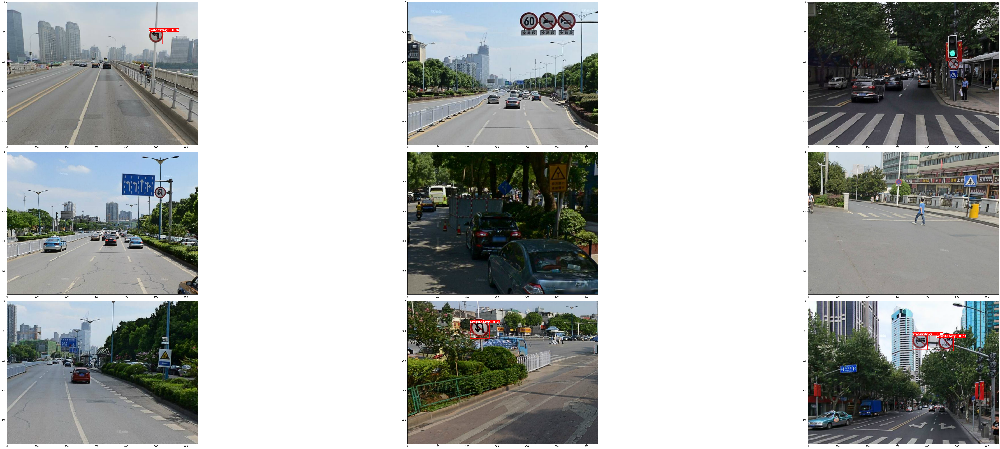

In [76]:
# Visualizing the sample images.
OUTPUT_PATH = 'ssd_infer_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)

## 9. 部署! <a class="anchor" id="head-9"></a> Deploy

If you trained a non-QAT model, you may export in FP32, FP16 or INT8 mode using the code block below. For INT8, you need to provide calibration image directory.

In [112]:
# tlt-export will fail if .etlt already exists. So we clear the export folder before tlt-export
!rm -rf $USER_EXPERIMENT_DIR/export
!mkdir -p $USER_EXPERIMENT_DIR/export
# Export in FP32 mode. Change --data_type to fp16 for FP16 mode
!tlt-export ssd -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_mobilenet_v2_epoch_020.tlt \
                -k $KEY \
                -o $USER_EXPERIMENT_DIR/export/ssd_mobilenet_v2_epoch_020.etlt \
                -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
                --batch_size 4 \
                --data_type fp32

# Uncomment to export in INT8 mode (generate calibration cache file).
# !tlt-export ssd -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_$EPOCH.tlt  \
#                 -o $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt \
#                 -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
#                 -k $KEY \
#                 --cal_image_dir  $USER_EXPERIMENT_DIR/data/testing/image_2 \
#                 --data_type int8 \
#                 --batch_size 16 \
#                 --batches 10 \
#                 --cal_cache_file $USER_EXPERIMENT_DIR/export/cal.bin  \
#                 --cal_data_file $USER_EXPERIMENT_DIR/export/cal.tensorfile

Using TensorFlow backend.
2020-10-17 10:59:41.806908: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 10:59:45.469306: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-10-17 10:59:45.470600: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: TITAN RTX major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:81:00.0
2020-10-17 10:59:45.470633: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 10:59:45.470678: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-10-17 10:59:45.472014: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2020-10-17 10:59:45.472073: I tensorflow/stream_

`Note:` In this example, for ease of execution we restrict the number of calibrating batches to 10. TLT recommends the use of at least 10% of the training dataset for int8 calibration.

If you train a QAT model, you may only export in INT8 mode using following code block. This generates an etlt file and the corresponding calibration cache. You can throw away the calibration cache and just use the etlt file in tlt-converter or DeepStream for FP32 or FP16 mode. But please note this gives sub-optimal results. If you want to deploy in FP32 or FP16, you should disable QAT in training.

In [97]:
# Uncomment to export QAT model in INT8 mode (generate calibration cache file).
# !rm -rf $USER_EXPERIMENT_DIR/export
# !mkdir -p $USER_EXPERIMENT_DIR/export
# !tlt-export ssd -m $USER_EXPERIMENT_DIR/experiment_dir_retrain/weights/ssd_resnet18_epoch_$EPOCH.tlt  \
#                 -o $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt \
#                 -e $SPECS_DIR/ssd_retrain_resnet18_kitti.txt \
#                 -k $KEY \
#                 --data_type int8 \
#                 --cal_cache_file $USER_EXPERIMENT_DIR/export/cal.bin

In [113]:
print('Exported model:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/export

Exported model:
------------
total 5.3M
-rw-r--r-- 1 root root 5.3M Oct 17 11:00 ssd_mobilenet_v2_epoch_020.etlt


Verify engine generation using the `tlt-converter` utility included with the docker.

The `tlt-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tlt-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the converter for jetson from the dev zone link [here](https://developer.nvidia.com/tlt-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Usually this file is called `config_infer_primary.txt` for detection models and `config_infer_secondary_*.txt` for classification models.

In [114]:
# Convert to TensorRT engine (FP32)
!tlt-converter -k $KEY \
               -d 3,300,300 \
               -o NMS \
               -e $USER_EXPERIMENT_DIR/export/trt.engine \
               -m 4 \
               -t fp32 \
               -i nchw \
               $USER_EXPERIMENT_DIR/export/ssd_mobilenet_v2_epoch_020.etlt

# Convert to TensorRT engine (FP16)
# !tlt-converter -k $KEY \
#                -d 3,384,1248 \
#                -o NMS \
#                -e $USER_EXPERIMENT_DIR/export/trt.engine \
#                -m 16 \
#                -t fp16 \
#                -i nchw \
#                $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt

# Convert to TensorRT engine (INT8).
# !tlt-converter -k $KEY  \
#                -d 3,384,1248 \
#                -o NMS \
#                -c $USER_EXPERIMENT_DIR/export/cal.bin \
#                -e $USER_EXPERIMENT_DIR/export/trt.engine \
#                -b 8 \
#                -m 16 \
#                -t int8 \
#                -i nchw \
#                $USER_EXPERIMENT_DIR/export/ssd_resnet18_epoch_$EPOCH.etlt

[INFO] Detected 1 inputs and 2 output network tensors.


In [115]:
print('Exported engine:')
print('------------')
!ls -lh $USER_EXPERIMENT_DIR/export/trt.engine

Exported engine:
------------
-rw-r--r-- 1 root root 8.5M Oct 17 11:01 /workspace/mydata/ssd/export/trt.engine


## 10.验证部署的模型 <a class="anchor" id="head-10"></a>Verify the deployed model 
Verify the converted engine by visualizing TensorRT inferences.

In [116]:
# Infer using TensorRT engine

# The engine batch size once created, cannot be alterred. So if you wish to run with a different batch-size,
# please re-run tlt-convert.

!tlt-infer ssd -m $USER_EXPERIMENT_DIR/export/trt.engine \
               -e $SPECS_DIR/ssd_train_mobilenet_v2_kitti.txt \
               -i /workspace/examples/ssd/test_samples \
               -o $USER_EXPERIMENT_DIR/ssd_infer_images \
               -t 0.1

Using TensorFlow backend.
2020-10-17 11:01:23.488996: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-10-17 11:01:26,715 [INFO] /usr/local/lib/python3.6/dist-packages/iva/ssd/utils/spec_loader.pyc: Merging specification from /workspace/mydata/ssd/specs/ssd_train_mobilenet_v2_kitti.txt
[TensorRT] WARNING: Current optimization profile is: 0. Please ensure there are no enqueued operations pending in this context prior to switching profiles
Using TensorRT engine for inference, setting batch size to engine's one: 4
100%|█████████████████████████████████████████████| 3/3 [00:00<00:00,  3.14it/s]


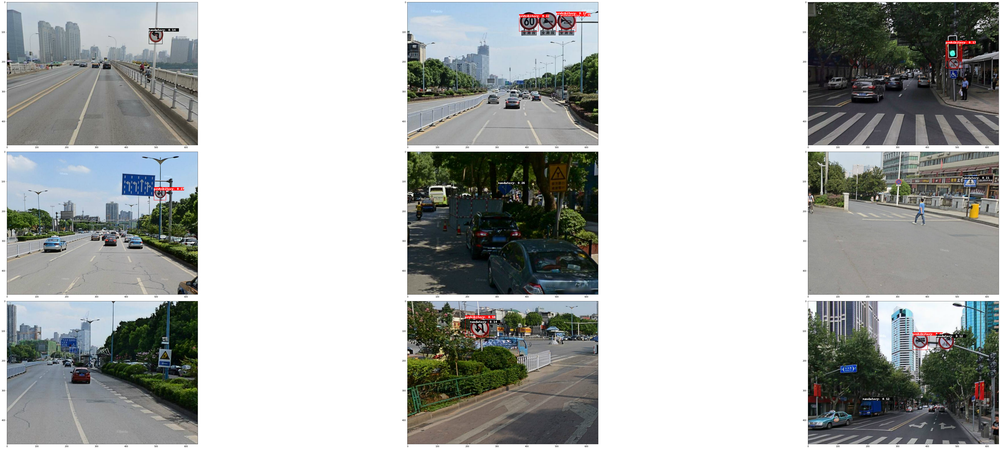

In [117]:
# Visualizing the sample images.
OUTPUT_PATH = 'ssd_infer_images' # relative path from $USER_EXPERIMENT_DIR.
COLS = 3 # number of columns in the visualizer grid.
IMAGES = 9 # number of images to visualize.

visualize_images(OUTPUT_PATH, num_cols=COLS, num_images=IMAGES)